# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:
glioma = 'DATASET/TRAIN/glioma'
meningioma = 'DATASET/TRAIN/meningioma'
notumor = 'DATASET/TRAIN/notumor'
pituitary = 'DATASET/TRAIN/pituitary'

In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR glioma:

======== Images in:  DATASET/TRAIN/glioma
Images_count :	 500
Min_width :	 512
Max_width :	 512
Min_height :	 512
Max_height :	 512



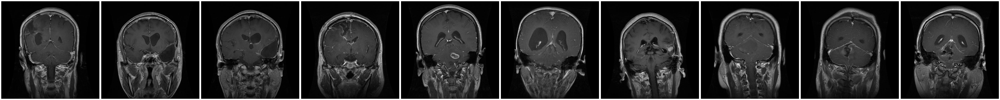

In [5]:
print("")
print("TRAINING DATA FOR glioma:")
print("")
images_details(glioma)
print("")
plot_images(glioma, 10) 


TRAINING DATA FOR meningioma:

======== Images in:  DATASET/TRAIN/meningioma
Images_count :	 500
Min_width :	 200
Max_width :	 1149
Min_height :	 207
Max_height :	 1019



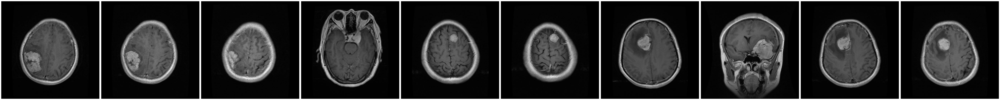

In [6]:
print("")
print("TRAINING DATA FOR meningioma:")
print("")
images_details(meningioma)
print("")
plot_images(meningioma, 10)


TRAINING DATA FOR notumor:

======== Images in:  DATASET/TRAIN/notumor
Images_count :	 500
Min_width :	 150
Max_width :	 1375
Min_height :	 168
Max_height :	 1446



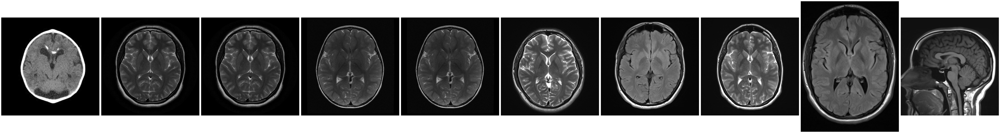

In [7]:
print("")
print("TRAINING DATA FOR notumor:")
print("")
images_details(notumor)
print("")
plot_images(notumor, 10)


TRAINING DATA FOR pituitary:

======== Images in:  DATASET/TRAIN/pituitary
Images_count :	 500
Min_width :	 201
Max_width :	 1365
Min_height :	 202
Max_height :	 1365



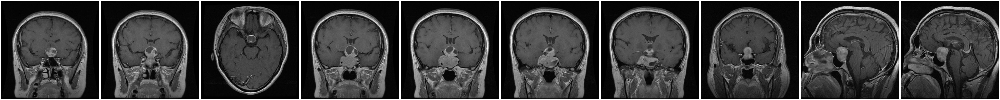

In [8]:
print("")
print("TRAINING DATA FOR pituitary:")
print("")
images_details(pituitary)
print("")
plot_images(pituitary, 10)

In [9]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('DATASET/TRAIN',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2000 images belonging to 4 classes.


In [10]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('DATASET/TEST',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2000 images belonging to 4 classes.


In [11]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(4, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [12]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [13]:
epochs = 10
batch_size = 512

In [14]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10
3/3 [==============================] - ETA: 0s - loss: 31.2911 - accuracy: 0.1979
Epoch 1: accuracy improved from -inf to 0.19792, saving model to MANUAL.h5
3/3 [==============================] - 6s 2s/step - loss: 31.2911 - accuracy: 0.1979 - val_loss: 16.4908 - val_accuracy: 0.3646
Epoch 2/10
3/3 [==============================] - ETA: 0s - loss: 7.2490 - accuracy: 0.3646 
Epoch 2: accuracy improved from 0.19792 to 0.36458, saving model to MANUAL.h5
3/3 [==============================] - 4s 1s/step - loss: 7.2490 - accuracy: 0.3646 - val_loss: 2.3622 - val_accuracy: 0.4792
Epoch 3/10
3/3 [==============================] - ETA: 0s - loss: 1.4798 - accuracy: 0.4271
Epoch 3: accuracy improved from 0.36458 to 0.42708, saving model to MANUAL.h5
3/3 [==============================] - 4s 2s/step - loss: 1.4798 - accuracy: 0.4271 - val_loss: 1.3602 - val_accuracy: 0.3646
Epoch 4/10
3/3 [==============================] - ETA: 0s - loss: 2.6720 - accuracy: 0.3125
Epoch 4: accuracy d

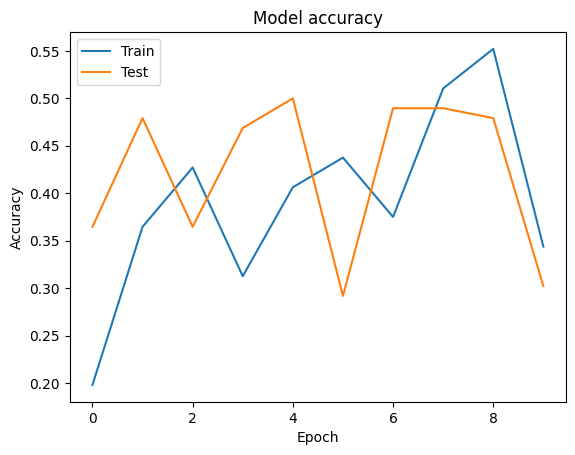

In [15]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

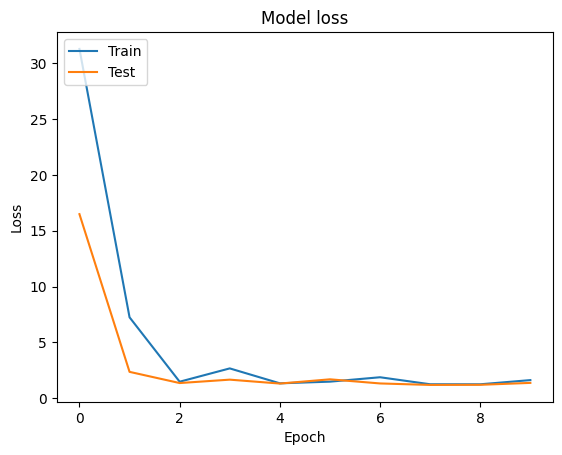

In [16]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()